# Analysis of the FISH images

Images taken during the last FISH experiment (2020), on the SP8 Leica microscope.

## Import the python libraries

In [4]:
# To import the files
import glob
from pathlib import Path

# To read the dataframes
import pandas as pd
import numpy as np

# To plot the images
import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1 import ImageGrid, AxesGrid
import seaborn as sns

# To analyse the images
from skimage.filters import gaussian, median
from skimage.restoration import estimate_sigma

# To export image in the different formats: png, ...
import imageio

# To draw manual ROI on the images
from roipoly import MultiRoi

## Eukaryote dataframe

### Load the eukaryote dataframe

In [5]:
# Read the image dataframe parquet file:
df_eukaryote = pd.read_parquet('parquets/df_eukaryote.parquet')

In [6]:
df_eukaryote.head(10)

,file,serie,channel,nbr_frames,shape_X,shape_Y,channel_count,Image.@UniqueID,Channel.@LUTName,Dimension.@DimID_X,...,Dimension.@NumberOfElements_Y,Dimension.@Length_Y,Dimension.@Unit_Y,ATLConfocalSettingDefinition.@ScanSpeed,ATLConfocalSettingDefinition.@Zoom,ATLConfocalSettingDefinition.@PixelDwellTime,ATLConfocalSettingDefinition.DetectorList.Detector.@Name,ATLConfocalSettingDefinition.DetectorList.Detector.@Type,ATLConfocalSettingDefinition.DetectorList.Detector.@Gain,ATLConfocalSettingDefinition.DetectorList.Detector.@Offset
168,200316_1_NoProbes.lif,Image001,0,1,512,512,4,07e1048b-6795-11ea-a94d-002432168676,Blue,1,...,512,0.000185,m,400.0,1.000000,0.000003,PMT 3,PMT,600.289921,0.000000
169,200316_1_NoProbes.lif,Image001,1,1,512,512,4,07e1048b-6795-11ea-a94d-002432168676,Green,1,...,512,0.000185,m,400.0,1.000000,0.000003,HyD4 SMD,HyD,350.666885,-0.006667
170,200316_1_NoProbes.lif,Image001,2,1,512,512,4,07e1048b-6795-11ea-a94d-002432168676,Gray,1,...,512,0.000185,m,400.0,1.000000,0.000003,PMT Trans,PMT,350.537881,0.000000
171,200316_1_NoProbes.lif,Image001,3,1,512,512,4,07e1048b-6795-11ea-a94d-002432168676,Red,1,...,512,0.000185,m,400.0,1.000000,0.000003,PMT 5,PMT,600.404364,0.000000
172,200316_1_NoProbes.lif,Image002,0,1,512,512,4,30830004-6795-11ea-a94d-002432168676,Blue,1,...,512,0.000185,m,400.0,1.000000,0.000003,PMT 3,PMT,600.289921,0.000000
173,200316_1_NoProbes.lif,Image002,1,1,512,512,4,30830004-6795-11ea-a94d-002432168676,Green,1,...,512,0.000185,m,400.0,1.000000,0.000003,HyD4 SMD,HyD,350.666885,-0.006667
174,200316_1_NoProbes.lif,Image002,2,1,512,512,4,30830004-6795-11ea-a94d-002432168676,Gray,1,...,512,0.000185,m,400.0,1.000000,0.000003,PMT Trans,PMT,350.537881,0.000000
175,200316_1_NoProbes.lif,Image002,3,1,512,512,4,30830004-6795-11ea-a94d-002432168676,Red,1,...,512,0.000185,m,400.0,1.000000,0.000003,PMT 5,PMT,600.404364,0.000000
256,200316_3_Triton_Probes.lif,Image001,0,1,632,632,4,fbbd1930-6793-11ea-a94d-002432168676,Blue,1,...,632,0.000037,m,400.0,5.000013,0.000003,PMT 3,PMT,600.289921,0.000000
257,200316_3_Triton_Probes.lif,Image001,1,1,632,632,4,fbbd1930-6793-11ea-a94d-002432168676,Green,1,...,632,0.000037,m,400.0,5.000013,0.000003,HyD4 SMD,HyD,350.666885,-0.006667


In [219]:
#Scale bar results in pixels:
df_eukaryote['scale_bar_10um'] = (0.000010*df_eukaryote['Dimension.@NumberOfElements_X'])/df_eukaryote['Dimension.@Length_X']
df_eukaryote['scale_bar_10um']

168     27.747098
169     27.747098
170     27.747098
171     27.747098
172     27.747098
          ...    
451    171.252039
452    171.252039
453    171.252039
454    171.252039
455    171.252039
Name: scale_bar_10um, Length: 484, dtype: float64

In [297]:
df_eukaryote['scale_bar_10um_unit'] = 'px'
df_eukaryote['scale_bar_10um_unit']

168    px
169    px
170    px
171    px
172    px
       ..
451    px
452    px
453    px
454    px
455    px
Name: scale_bar_10um_unit, Length: 484, dtype: object

In [305]:
df_eukaryote.loc[37]

file                                                                          200316_Sample_12.lif
serie                                                                                     Image005
channel                                                                                          1
nbr_frames                                                                                       1
shape_X                                                                                        512
shape_Y                                                                                        512
channel_count                                                                                    4
Image.@UniqueID                                               08a1bb28-6781-11ea-a94d-002432168676
Channel.@LUTName                                                                             Green
Dimension.@DimID_X                                                                               1
Dimension.

In [8]:
df_eukaryote.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 484 entries, 168 to 455
Data columns (total 24 columns):
 #   Column                                                      Non-Null Count  Dtype   
---  ------                                                      --------------  -----   
 0   file                                                        484 non-null    object  
 1   serie                                                       484 non-null    object  
 2   channel                                                     484 non-null    int64   
 3   nbr_frames                                                  484 non-null    int64   
 4   shape_X                                                     484 non-null    int64   
 5   shape_Y                                                     484 non-null    int64   
 6   channel_count                                               484 non-null    int64   
 7   Image.@UniqueID                                             484 non-null    ob

#### Check the values of interest for the analysis

In [9]:
np.unique(df_eukaryote[['Dimension.@NumberOfElements_X', 'Dimension.@NumberOfElements_Y']].values, return_counts=True)

(array([320, 512, 632, 3144], dtype=object), array([  8, 280, 392, 288]))

In [10]:
df_eukaryote['ATLConfocalSettingDefinition.@ScanSpeed'].unique()

array([400.])

Same scan speed used for all the images: 400 Hz

In [11]:
df_eukaryote['ATLConfocalSettingDefinition.@Zoom'].value_counts()

5.000013     268
1.000000     212
10.000025      4
Name: ATLConfocalSettingDefinition.@Zoom, dtype: int64

Three different zoom setting are used: 1, 5 and 10 time.

In [12]:
df_eukaryote['ATLConfocalSettingDefinition.@PixelDwellTime'].value_counts()

2.562500e-06    196
5.125000e-07    144
3.162500e-06    140
5.075000e-06      4
Name: ATLConfocalSettingDefinition.@PixelDwellTime, dtype: int64

In [13]:
df_eukaryote.groupby('Channel.@LUTName')['ATLConfocalSettingDefinition.DetectorList.Detector.@Gain'].value_counts()

Channel.@LUTName  ATLConfocalSettingDefinition.DetectorList.Detector.@Gain
Blue              600.289921                                                  114
                  600.308995                                                    7
Gray              350.537881                                                  114
                  400.034333                                                    7
Green             350.666885                                                  114
                  349.980225                                                    7
Red               600.881209                                                   58
                  600.404364                                                   56
                  600.862135                                                    7
Name: ATLConfocalSettingDefinition.DetectorList.Detector.@Gain, dtype: int64

In [14]:
df_eukaryote.groupby('Channel.@LUTName')['ATLConfocalSettingDefinition.DetectorList.Detector.@Offset'].value_counts()

Channel.@LUTName  ATLConfocalSettingDefinition.DetectorList.Detector.@Offset
Blue               0.000000                                                     114
                  -0.073333                                                       7
Gray               0.000000                                                     121
Green             -0.006667                                                     121
Red                0.000000                                                     121
Name: ATLConfocalSettingDefinition.DetectorList.Detector.@Offset, dtype: int64

## Load the numpy files containing the images

In [15]:
image_arrays = sorted(glob.glob('../image_processing/image_arrays/*.npy'))

In [16]:
image_arrays

['../image_processing/image_arrays/0_images_320_320.npy',
 '../image_processing/image_arrays/1_images_512_512.npy',
 '../image_processing/image_arrays/2_images_600_600.npy',
 '../image_processing/image_arrays/3_images_632_632.npy',
 '../image_processing/image_arrays/4_images_1408_1408.npy',
 '../image_processing/image_arrays/5_images_1872_1872.npy',
 '../image_processing/image_arrays/6_images_2480_2480.npy',
 '../image_processing/image_arrays/7_images_2608_2608.npy',
 '../image_processing/image_arrays/8_images_3144_3144.npy']

In [17]:
image_info = pd.read_parquet('image_info_dataframe.parquet')

In [18]:
shape_dict = image_info.groupby(['shape_X', 'shape_Y']).indices

In [19]:
name_list = []
shape_list = []
arrays = dict()

for indices, array in zip(shape_dict, image_arrays):
    name_list.append(Path(array).stem)
    shape_list.append(indices)
    images = np.load(array)
    for idx, img in zip(shape_dict[indices], images):
        arrays.update({idx:img})

In [20]:
len(arrays)

1188

In [21]:
name_list

['0_images_320_320',
 '1_images_512_512',
 '2_images_600_600',
 '3_images_632_632',
 '4_images_1408_1408',
 '5_images_1872_1872',
 '6_images_2480_2480',
 '7_images_2608_2608',
 '8_images_3144_3144']

In [22]:
shape_list

[(320, 320),
 (512, 512),
 (600, 600),
 (632, 632),
 (1408, 1408),
 (1872, 1872),
 (2480, 2480),
 (2608, 2608),
 (3144, 3144)]

## Test on three different images

### Images selected for testing

In [23]:
# indexes for the different channels
img1 = list(range(88,92))
img2 = list(range(108,112))
img3 = list(range(120,124))

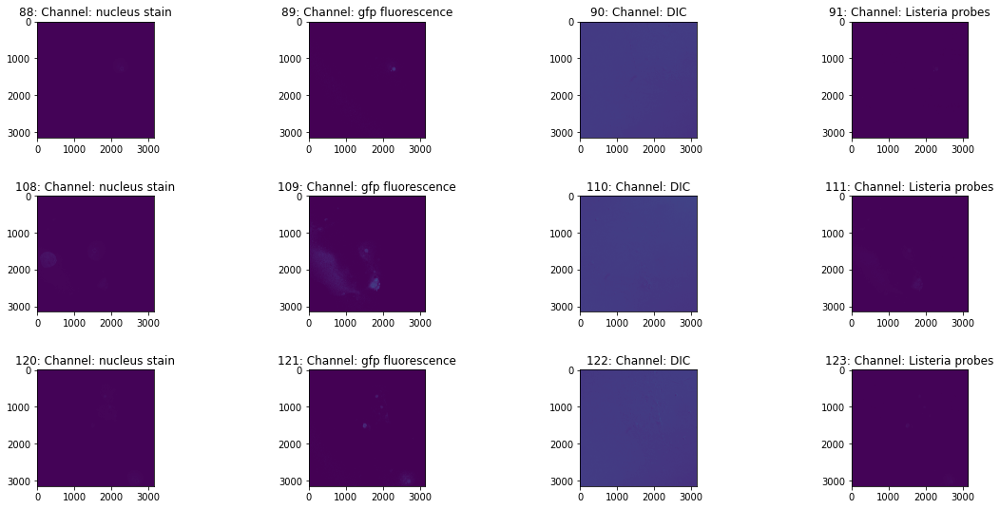

CPU times: user 3.96 s, sys: 203 ms, total: 4.17 s
Wall time: 4.2 s


In [24]:
%%time
%matplotlib inline

row = 3
col = 4

a = col*5
b = row*3

k = 0
t = 0

title = ['nucleus stain', 'gfp fluorescence', 'DIC', 'Listeria probes']

fig = plt.figure(figsize=(a, b))
fig.subplots_adjust(hspace=0.5, wspace=0.1)
for idx in (img1 + img2 + img3):
    plt.subplot(row, col, k+1)
    plt.imshow(arrays[idx], vmin=0, vmax=255)
    plt.title(f'{idx}: Channel: {title[t]}')
    k=k+1
    if t == 3:
        t = 0
    else:
        t = t+1
        
    
plt.show()

### Intensity analysis based on the GFP channels

In [25]:
# GFP and Probe test images
#gfp_idx = [img1[1], img2[1], img3[1]]
#probe_idx = [img1[3], img2[3], img3[3]]

In [26]:
set(df_eukaryote['file'])

{'200310_Probes.lif',
 '200311_Sample_1.lif',
 '200311_Sample_11.lif',
 '200311_Sample_2.lif',
 '200311_Sample_4.lif',
 '200311_Sample_9.lif',
 '200316_1_NoProbes.lif',
 '200316_3_Triton_Probes.lif',
 '200316_Sample_10.lif',
 '200316_Sample_12.lif',
 '200316_Sample_4.lif',
 '200316_Sample_5.lif',
 '200316_Sample_6.lif'}

In [27]:
# Select the filme of interest

read_file = '200316_Sample_12.lif'

In [28]:
# GFP and Probe images

gfp_idx = df_eukaryote.loc[(df_eukaryote['file'] == read_file) & (df_eukaryote['Channel.@LUTName'] == 'Green')].index.tolist()
probe_idx = df_eukaryote.loc[(df_eukaryote['file'] == read_file) & (df_eukaryote['Channel.@LUTName'] == 'Red')].index.tolist()
DIC_idx = df_eukaryote.loc[(df_eukaryote['file'] == read_file) & (df_eukaryote['Channel.@LUTName'] == 'Gray')].index.tolist()
nucleus_idx = df_eukaryote.loc[(df_eukaryote['file'] == read_file) & (df_eukaryote['Channel.@LUTName'] == 'Blue')].index.tolist()

In [30]:
def get_images_from_idx(index_list):
    ''' Return a list of images corresponding to the indexes'''
    
    images = []
    
    for idx in index_list:
        images.append(arrays[idx])
    return images


def create_ROIs_list_name(ROI_number):
    '''To create a list a ROI names that will contain the different created ROIs'''
    
    roi_list = []
    for num in list(range(ROI_number)):
        roi_list.append(f'roi_{num}')
    return roi_list


def get_ROIs_mean_and_std(multi_roi, image):
    '''List the names, means and the standard deviation calculated for each drawn ROIs'''
    
    name_list = []
    mean_list = []
    std_list = []

    for name, roi in multi_roi.rois.items():
        name_list.append(name)
        m, s = roi.get_mean_and_std(image)
        mean_list.append(m)
        std_list.append(s)
        
    return name_list, mean_list, std_list 


def get_ROI_masks(multi_roi, image, image_index, time):
    '''Retrieve and save the ROIs location as a list of numpy array masks'''
    
    mask_list = []
    
    for name, roi in multi_roi.rois.items():
        mask = roi.get_mask(image)
        mask_list.append(mask)
        
    return mask_list, np.save(f'numpy_masks/masks_{time}_{image_index}'.replace(' ', '_'), mask_list)


def get_ROI_area(masks):
    '''Return the area for all the calculated ROIs'''
    
    area_list = []
    
    for msk in masks:
        area_list.append(np.sum(msk.astype(np.int)))
       
    return area_list


def get_min_and_max(mask, current_image):
    '''Return the min and max intensity pixel based on the roi of an image'''
    
    minimum = np.amin(np.extract(mask, current_image))
    maximum = np.amax(np.extract(mask, current_image))
    
    return minimum, maximum



def get_ROI_min_and_max(masks, current_image):
    '''Return the list of min and max intensity pixel for all the ROI of an image'''
    
    min_px = []
    max_px = []

    for msk in masks:
        mn, mx = get_min_and_max(msk, current_image)
        min_px.append(mn)
        max_px.append(mx)
        
    return min_px, max_px

In [31]:
# Retrieve the gfp channel of the three selected channels
gfp_img = get_images_from_idx(gfp_idx)
probe_img = get_images_from_idx(probe_idx)

In [32]:
# Time stamp for the dataframes and numpy arrays
running_time = pd.Timestamp.now(tz=None)

#### Positive and negative samplings

In [29]:
%matplotlib qt

idx_gfp_list = []
idx_probes_list = []

idx_gfp_list_neg_cont = []
idx_probe_list_neg_cont = []

type_img_list = []

# GFP results
name_gfp = []
mean_gfp = []
std_gfp = []
ROI_drawn_gfp = []
area_gfp = []
min_px_list_gfp = []
max_px_list_gfp = []

# Probe results
mean_probes = []
std_probes = []
min_px_list_probes = []
max_px_list_probes = []

# Negative control for gfp channel
name_gfp_neg_cont = []
mean_gfp_neg_cont = []
std_gfp_neg_cont = []
ROI_drawn_gfp_neg_cont = []
area_gfp_neg_cont = []
min_px_list_gfp_neg_cont = []
max_px_list_gfp_neg_cont = []

# Negative control for probe channel
mean_probe_neg_cont = []
std_probe_neg_cont = []
min_px_list_probe_neg_cont = []
max_px_list_probe_neg_cont = []


# Show the image
for i in range(len(gfp_idx)):
    
    img_gfp = gfp_img[i]
    idx_gfp = gfp_idx[i]
    
    img_probe = probe_img[i]
    idx_probe = probe_idx[i]
    
    
    # Create empty ROI list
    numb_of_roi = 10
    rois = create_ROIs_list_name(numb_of_roi)
    
    
    # Draw multiple ROIs
    fig = plt.figure()
    plt.imshow(img_gfp, cmap='viridis', vmin=0, vmax=255)
    plt.title(f'{idx_gfp}: Channel: GFP fluorescence')
    
    multiroi_img = MultiRoi(fig=fig, ax=None, roi_names=rois, color_cycle=('b', 'g', 'r', 'c', 'm', 'y', 'k', 'w', 'orange', 'pink'))
    
    
    fig = plt.figure()
    plt.imshow(img_gfp, cmap='viridis', vmin=0, vmax=255)
    plt.title(f'{idx_gfp}: Negative control')
    
    multiroi_img_neg = MultiRoi(fig=fig, ax=None, roi_names=rois, color_cycle=('b', 'g', 'r', 'c', 'm', 'y', 'k', 'w', 'orange', 'pink'))
    
    
    # Create a saved numpy array file of the masks
    masks, _ = get_ROI_masks(multiroi_img, img_gfp, idx_gfp, running_time)
    
    set_idx = f'{idx_gfp}_neg_control'
    masks_neg_control, _ = get_ROI_masks(multiroi_img_neg, img_gfp, set_idx, running_time)
    
    
    # Names, means and stds of the ROIs
    name_g, mean_g, std_g = get_ROIs_mean_and_std(multiroi_img, img_gfp)
    name_gfp.append(name_g)
    mean_gfp.append(mean_g)
    std_gfp.append(std_g)
    
    name_g_neg, mean_g_neg, std_g_neg = get_ROIs_mean_and_std(multiroi_img_neg, img_gfp)
    name_gfp_neg_cont.append(name_g_neg)
    mean_gfp_neg_cont.append(mean_g_neg)
    std_gfp_neg_cont.append(std_g_neg)
    
    name_p, mean_p, std_p = get_ROIs_mean_and_std(multiroi_img, img_probe)
    mean_probes.append(mean_p)
    std_probes.append(std_p)
    
    name_p_neg, mean_p_neg, std_p_neg = get_ROIs_mean_and_std(multiroi_img_neg, img_probe)
    mean_probe_neg_cont.append(mean_p_neg)
    std_probe_neg_cont.append(std_p_neg)
    
    
    # Number ROIs
    num_ROIs = len(multiroi_img.rois)
    ROI_drawn_gfp.append(num_ROIs)
    
    num_ROIs_neg = len(multiroi_img_neg.rois)
    ROI_drawn_gfp_neg_cont.append(num_ROIs_neg)
    
    
    # Create lists for columns 'image_idx' and 'type_image'
    for i in range(num_ROIs):
        idx_gfp_list.append(idx_gfp)
        idx_probes_list.append(idx_probe)
        
    for i in range(num_ROIs_neg):
        idx_gfp_list_neg_cont.append(idx_gfp)
        idx_probe_list_neg_cont.append(idx_probe)
    
    
    # Area ROIs
    area = get_ROI_area(masks)
    area_gfp.append(area)
    
    area_neg = get_ROI_area(masks_neg_control)
    area_gfp_neg_cont.append(area_neg)
    
    
    # Min and Max pixel for each ROI
    min_px_list_g, max_px_list_g = get_ROI_min_and_max(masks, img_gfp) 
    min_px_list_gfp.append(min_px_list_g)
    max_px_list_gfp.append(max_px_list_g)
    
    min_px_list_g_neg, max_px_list_g_neg = get_ROI_min_and_max(masks_neg_control, img_gfp)
    min_px_list_gfp_neg_cont.append(min_px_list_g_neg)
    max_px_list_gfp_neg_cont.append(max_px_list_g_neg)
    
    min_px_list_p, max_px_list_p = get_ROI_min_and_max(masks, img_probe)
    min_px_list_probes.append(min_px_list_p)
    max_px_list_probes.append(max_px_list_p)
    
    min_px_list_p_neg, max_px_list_p_neg = get_ROI_min_and_max(masks_neg_control, img_probe)
    min_px_list_probe_neg_cont.append(min_px_list_p_neg)
    max_px_list_probe_neg_cont.append(max_px_list_p_neg)

##### Correction for GFP channel

In [107]:
b=[]
a = gfp_img[0].tolist()
for x in a:
    b.extend(x)
set(b)

{0,
 8,
 17,
 18,
 26,
 27,
 35,
 36,
 37,
 38,
 41,
 44,
 45,
 46,
 47,
 48,
 50,
 53,
 54,
 55,
 56,
 62,
 63,
 64,
 65,
 66,
 68,
 70,
 71,
 72,
 73,
 74,
 75,
 79,
 80,
 83,
 87,
 88,
 89,
 90,
 92,
 97,
 98,
 99,
 107,
 148,
 177,
 195,
 196,
 218,
 222,
 247,
 255}

In [112]:
new_image = np.where(gfp_img[0] >= 200, 0, gfp_img[0])
b=[]
a = new_image.tolist()
for x in a:
    b.extend(x)
set(b)

{0,
 8,
 17,
 18,
 26,
 27,
 35,
 36,
 37,
 38,
 41,
 44,
 45,
 46,
 47,
 48,
 50,
 53,
 54,
 55,
 56,
 62,
 63,
 64,
 65,
 66,
 68,
 70,
 71,
 72,
 73,
 74,
 75,
 79,
 80,
 83,
 87,
 88,
 89,
 90,
 92,
 97,
 98,
 99,
 107,
 148,
 177,
 195,
 196}

In [113]:
def get_min_and_max_corrected(mask, current_image):
    '''Return the min and max intensity pixel based on the roi of an image considering the value 250 as induced by the receptor'''
    
    new_image = np.where(current_image >= 250, 0, current_image)
    
    minimum = np.amin(np.extract(mask, new_image))
    maximum = np.amax(np.extract(mask, new_image))
    
    return minimum, maximum


def get_ROI_min_and_max_corrected(masks, current_image):
    '''Return the list of min and max intensity pixel for all the ROI of an image'''
    
    min_px = []
    max_px = []

    for msk in masks:
        mn, mx = get_min_and_max_corrected(msk, current_image)
        min_px.append(mn)
        max_px.append(mx)
        
    return min_px, max_px

In [114]:
gfp_img[0].shape

(512, 512)

In [115]:
gfp_idx[0]

21

In [116]:
#masks = np.load(f'numpy_masks/masks_{running_time}_{idx}.npy'.replace(' ', '_')).shape
masks = np.load('numpy_masks/masks_2020-08-28_15:32:57.816767_21.npy')

In [117]:
masks.shape

(3, 512, 512)

In [118]:
min_px = []
max_px = []

for msk in masks:
    mn, mx = get_min_and_max_corrected(msk, gfp_img[0])
    min_px.append(mn)
    max_px.append(mx)

In [119]:
max_px

[107, 80, 70]

In [120]:
time = '2020-08-28 15:32:57.816767'

# Min and Max pixel for each ROI
corr_min_px_list_gfp = []
corr_max_px_list_gfp = []
corr_min_px_list_gfp_neg_cont = []
corr_max_px_list_gfp_neg_cont = []

for idx, image in zip(gfp_idx, gfp_img):

    #masks = np.load(f'numpy_masks/masks_{running_time}_{idx}.npy'.replace(' ', '_'))
    masks = np.load(f'numpy_masks/masks_{time}_{idx}.npy'.replace(' ', '_'))
    
    corr_min_px_list_g, corr_max_px_list_g = get_ROI_min_and_max_corrected(masks, image) 
    corr_min_px_list_gfp.append(corr_min_px_list_g)
    corr_max_px_list_gfp.append(corr_max_px_list_g)
    
    
    set_idx = f'{idx}_neg_control'
    #masks_neg_control = np.load(f'numpy_masks/masks_{running_time}_{set_idx}.npy'.replace(' ', '_'))
    masks_neg_control = np.load(f'numpy_masks/masks_{time}_{set_idx}.npy'.replace(' ', '_'))
    
    corr_min_px_list_g_neg, corr_max_px_list_g_neg = get_ROI_min_and_max_corrected(masks_neg_control, image)
    corr_min_px_list_gfp_neg_cont.append(corr_min_px_list_g_neg)
    corr_max_px_list_gfp_neg_cont.append(corr_max_px_list_g_neg)

In [121]:
corr_min_px_intensity = pd.to_numeric(pd.Series(data=corr_min_px_list_gfp).explode().reset_index(drop=True))
corr_max_px_intensity = pd.to_numeric(pd.Series(data=corr_max_px_list_gfp).explode().reset_index(drop=True))

df_gfp = pd.read_parquet(f'parquets/df_gfp_{read_file}_{time}.parquet'.replace(' ', '_'))

df_gfp['corr_min_px_intensity'] = corr_min_px_intensity
df_gfp['corr_max_px_intensity'] = corr_max_px_intensity

df_gfp.to_parquet(f'parquets/df_gfp_{read_file}_{time}.parquet'.replace(' ', '_'))

In [123]:
df_probes = pd.read_parquet(f'parquets/df_probes_{read_file}_{time}.parquet'.replace(' ', '_'))

df_probes['corr_min_px_intensity'] = df_probes['min_px_intensity']
df_probes['corr_max_px_intensity'] = df_probes['max_px_intensity']

df_probes.to_parquet(f'parquets/df_probes_{read_file}_{time}.parquet'.replace(' ', '_'))

In [124]:
corr_min_px_intensity = pd.to_numeric(pd.Series(data=corr_min_px_list_gfp_neg_cont).explode().reset_index(drop=True))
corr_max_px_intensity = pd.to_numeric(pd.Series(data=corr_max_px_list_gfp_neg_cont).explode().reset_index(drop=True))

df_gfp_neg_cont = pd.read_parquet(f'parquets/df_gfp_neg_cont_{read_file}_{time}.parquet'.replace(' ', '_'))

df_gfp_neg_cont['corr_min_px_intensity'] = corr_min_px_intensity
df_gfp_neg_cont['corr_max_px_intensity'] = corr_max_px_intensity

df_gfp_neg_cont.to_parquet(f'parquets/df_gfp_neg_cont_{read_file}_{time}.parquet'.replace(' ', '_'))

In [125]:
df_probes_neg_cont = pd.read_parquet(f'parquets/df_probes_neg_cont_{read_file}_{time}.parquet'.replace(' ', '_'))

df_probes_neg_cont['corr_min_px_intensity'] = df_probes_neg_cont['min_px_intensity']
df_probes_neg_cont['corr_max_px_intensity'] = df_probes_neg_cont['max_px_intensity']

df_probes_neg_cont.to_parquet(f'parquets/df_probes_neg_cont_{read_file}_{time}.parquet'.replace(' ', '_'))

#### Save results into dataframes

##### GFP Positive

In [76]:
# Create the dataframe column by column with the retrieved information for the gfp channel:

idx_image = pd.to_numeric(pd.Series(data=idx_gfp_list).explode().reset_index(drop=True))
roi_name = pd.Series(data=name_gfp).explode().reset_index(drop=True)
average_px_intensity = pd.to_numeric(pd.Series(data=mean_gfp).explode().reset_index(drop=True))
std_px_intensity = pd.to_numeric(pd.Series(data=std_gfp).explode().reset_index(drop=True))
roi_px_area = pd.to_numeric(pd.Series(data=area_gfp).explode().reset_index(drop=True))
min_px_intensity = pd.to_numeric(pd.Series(data=min_px_list_gfp).explode().reset_index(drop=True))
max_px_intensity = pd.to_numeric(pd.Series(data=max_px_list_gfp).explode().reset_index(drop=True))
corr_min_px_intensity = pd.to_numeric(pd.Series(data=corr_min_px_list_gfp).explode().reset_index(drop=True))
corr_max_px_intensity = pd.to_numeric(pd.Series(data=corr_max_px_list_gfp).explode().reset_index(drop=True))

df_gfp = pd.DataFrame(data={'idx_image': idx_image, 'roi_name': roi_name, 'average_px_intensity': average_px_intensity, 'std_px_intensity': std_px_intensity, 'roi_px_area': roi_px_area,
                            'min_px_intensity': min_px_intensity, 'max_px_intensity': max_px_intensity,
                            'corr_min_px_intensity': corr_min_px_intensity, 'corr_max_px_intensity': corr_max_px_intensity})
df_gfp.insert(1, 'type_image', 'Observed_L-form')
df_gfp.insert(2, 'channel', 'GFP')
df_gfp[['type_image', 'channel']] = df_gfp[['type_image', 'channel']].astype('category')

NameError: name 'idx_gfp_list' is not defined

In [87]:
df_gfp.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 72 entries, 0 to 71
Data columns (total 11 columns):
 #   Column                 Non-Null Count  Dtype   
---  ------                 --------------  -----   
 0   idx_image              72 non-null     int64   
 1   type_image             72 non-null     category
 2   channel                72 non-null     category
 3   roi_name               72 non-null     object  
 4   average_px_intensity   72 non-null     float64 
 5   std_px_intensity       72 non-null     float64 
 6   roi_px_area            72 non-null     int64   
 7   min_px_intensity       72 non-null     int64   
 8   max_px_intensity       72 non-null     int64   
 9   corr_min_px_intensity  2 non-null      float64 
 10  corr_max_px_intensity  2 non-null      float64 
dtypes: category(2), float64(4), int64(4), object(1)
memory usage: 5.5+ KB


In [88]:
df_gfp.to_parquet(f'parquets/df_gfp_{read_file}_{running_time}.parquet'.replace(' ', '_'))

In [89]:
pd.read_parquet(f'parquets/df_gfp_{read_file}_{running_time}.parquet'.replace(' ', '_'))

,idx_image,type_image,channel,roi_name,average_px_intensity,std_px_intensity,roi_px_area,min_px_intensity,max_px_intensity,corr_min_px_intensity,corr_max_px_intensity
0,21,Observed_L-form,GFP,roi_0,25.177439,15.931714,6684,0,255,0.0,218.0
1,21,Observed_L-form,GFP,roi_1,23.355630,15.194523,897,0,80,0.0,255.0
2,21,Observed_L-form,GFP,roi_2,23.220126,14.477329,159,0,70,NaN,NaN
3,25,Observed_L-form,GFP,roi_0,34.464481,19.100184,183,0,97,NaN,NaN
4,25,Observed_L-form,GFP,roi_1,33.689655,15.644991,29,8,70,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...
67,153,Observed_L-form,GFP,roi_3,33.566327,45.584623,980,0,255,NaN,NaN
68,157,Observed_L-form,GFP,roi_0,13.096130,12.447222,1602,0,87,NaN,NaN
69,161,Observed_L-form,GFP,roi_0,20.830882,17.827835,136,0,99,NaN,NaN
70,165,Observed_L-form,GFP,roi_0,46.391304,49.590624,736,0,218,NaN,NaN


##### Probes Positive

In [90]:
# Create the dataframe column by column with the retrieved information for the probe channel:

idx_image = pd.Series(data=idx_probes_list).explode().reset_index(drop=True)
roi_name = pd.Series(data=name_gfp).explode().reset_index(drop=True)
average_px_intensity = pd.to_numeric(pd.Series(data=mean_probes).explode().reset_index(drop=True))
std_px_intensity = pd.to_numeric(pd.Series(data=std_probes).explode().reset_index(drop=True))
roi_px_area = pd.to_numeric(pd.Series(data=area_gfp).explode().reset_index(drop=True))
min_px_intensity = pd.to_numeric(pd.Series(data=min_px_list_probes).explode().reset_index(drop=True))
max_px_intensity = pd.to_numeric(pd.Series(data=max_px_list_probes).explode().reset_index(drop=True))
corr_min_px_intensity = min_px_intensity
corr_max_px_intensity = max_px_intensity

df_probes = pd.DataFrame(data={'idx_image': idx_image, 'roi_name': roi_name, 'average_px_intensity': average_px_intensity, 'std_px_intensity': std_px_intensity, 'roi_px_area': roi_px_area,
                            'min_px_intensity': min_px_intensity, 'max_px_intensity': max_px_intensity,
                            'corr_min_px_intensity': corr_min_px_intensity, 'corr_max_px_intensity': corr_max_px_intensity})
df_probes.insert(1, 'type_image', 'Observed_L-form')
df_probes.insert(2, 'channel', 'Probes')
df_probes[['type_image', 'channel']] = df_probes[['type_image', 'channel']].astype('category')

In [91]:
df_probes.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 72 entries, 0 to 71
Data columns (total 11 columns):
 #   Column                 Non-Null Count  Dtype   
---  ------                 --------------  -----   
 0   idx_image              72 non-null     int64   
 1   type_image             72 non-null     category
 2   channel                72 non-null     category
 3   roi_name               72 non-null     object  
 4   average_px_intensity   72 non-null     float64 
 5   std_px_intensity       72 non-null     float64 
 6   roi_px_area            72 non-null     int64   
 7   min_px_intensity       72 non-null     int64   
 8   max_px_intensity       72 non-null     int64   
 9   corr_min_px_intensity  72 non-null     int64   
 10  corr_max_px_intensity  72 non-null     int64   
dtypes: category(2), float64(2), int64(6), object(1)
memory usage: 5.5+ KB


In [92]:
df_probes.to_parquet(f'parquets/df_probes_{read_file}_{running_time}.parquet'.replace(' ', '_'))

In [93]:
pd.read_parquet(f'parquets/df_probes_{read_file}_{running_time}.parquet'.replace(' ', '_'))

,idx_image,type_image,channel,roi_name,average_px_intensity,std_px_intensity,roi_px_area,min_px_intensity,max_px_intensity,corr_min_px_intensity,corr_max_px_intensity
0,23,Observed_L-form,Probes,roi_0,5.740126,2.470520,6684,2,22,2,22
1,23,Observed_L-form,Probes,roi_1,4.788183,2.125849,897,2,15,2,15
2,23,Observed_L-form,Probes,roi_2,5.094340,1.886038,159,2,12,2,12
3,27,Observed_L-form,Probes,roi_0,7.519126,3.308941,183,3,22,3,22
4,27,Observed_L-form,Probes,roi_1,5.896552,2.155103,29,3,9,3,9
...,...,...,...,...,...,...,...,...,...,...,...
67,155,Observed_L-form,Probes,roi_3,7.534694,7.082158,980,2,53,2,53
68,159,Observed_L-form,Probes,roi_0,4.343321,2.107174,1602,2,14,2,14
69,163,Observed_L-form,Probes,roi_0,8.073529,4.461654,136,2,24,2,24
70,167,Observed_L-form,Probes,roi_0,10.194293,8.346050,736,2,61,2,61


##### GFP Negative control

In [94]:
# Create the dataframe column by column with the retrieved information for the gfp channel neg control:

idx_image = pd.to_numeric(pd.Series(data=idx_gfp_list_neg_cont).explode().reset_index(drop=True))
roi_name = pd.Series(data=name_gfp_neg_cont).explode().reset_index(drop=True)
average_px_intensity = pd.to_numeric(pd.Series(data=mean_gfp_neg_cont).explode().reset_index(drop=True))
std_px_intensity = pd.to_numeric(pd.Series(data=std_gfp_neg_cont).explode().reset_index(drop=True))
roi_px_area = pd.to_numeric(pd.Series(data=area_gfp_neg_cont).explode().reset_index(drop=True))
min_px_intensity = pd.to_numeric(pd.Series(data=min_px_list_gfp_neg_cont).explode().reset_index(drop=True))
max_px_intensity = pd.to_numeric(pd.Series(data=max_px_list_gfp_neg_cont).explode().reset_index(drop=True))
corr_min_px_intensity = pd.to_numeric(pd.Series(data=corr_min_px_list_gfp_neg_cont).explode().reset_index(drop=True))
corr_max_px_intensity = pd.to_numeric(pd.Series(data=corr_max_px_list_gfp_neg_cont).explode().reset_index(drop=True))

df_gfp_neg_cont = pd.DataFrame(data={'idx_image': idx_image, 'roi_name': roi_name, 'average_px_intensity': average_px_intensity, 'std_px_intensity': std_px_intensity, 'roi_px_area': roi_px_area,
                            'min_px_intensity': min_px_intensity, 'max_px_intensity': max_px_intensity,
                            'corr_min_px_intensity': corr_min_px_intensity, 'corr_max_px_intensity': corr_max_px_intensity})
df_gfp_neg_cont.insert(1, 'type_image', 'Negative_control')
df_gfp_neg_cont.insert(2, 'channel', 'GFP')
df_gfp_neg_cont[['type_image', 'channel']] = df_gfp_neg_cont[['type_image', 'channel']].astype('category')

In [95]:
df_gfp_neg_cont.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 75 entries, 0 to 74
Data columns (total 11 columns):
 #   Column                 Non-Null Count  Dtype   
---  ------                 --------------  -----   
 0   idx_image              75 non-null     int64   
 1   type_image             75 non-null     category
 2   channel                75 non-null     category
 3   roi_name               75 non-null     object  
 4   average_px_intensity   75 non-null     float64 
 5   std_px_intensity       75 non-null     float64 
 6   roi_px_area            75 non-null     int64   
 7   min_px_intensity       75 non-null     int64   
 8   max_px_intensity       75 non-null     int64   
 9   corr_min_px_intensity  2 non-null      float64 
 10  corr_max_px_intensity  2 non-null      float64 
dtypes: category(2), float64(4), int64(4), object(1)
memory usage: 5.7+ KB


In [96]:
df_gfp_neg_cont

,idx_image,type_image,channel,roi_name,average_px_intensity,std_px_intensity,roi_px_area,min_px_intensity,max_px_intensity,corr_min_px_intensity,corr_max_px_intensity
0,21,Negative_control,GFP,roi_0,16.101565,12.292005,5622,0,70,0.0,54.0
1,21,Negative_control,GFP,roi_1,15.881950,12.131443,1313,0,70,0.0,164.0
2,21,Negative_control,GFP,roi_2,0.631579,2.157253,114,0,8,NaN,NaN
3,21,Negative_control,GFP,roi_3,0.423427,1.906701,2527,0,26,NaN,NaN
4,21,Negative_control,GFP,roi_4,0.343750,1.622293,256,0,8,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...
70,153,Negative_control,GFP,roi_3,1.313167,8.317850,1686,0,54,NaN,NaN
71,157,Negative_control,GFP,roi_0,0.225564,1.484843,1330,0,10,NaN,NaN
72,161,Negative_control,GFP,roi_0,1.791667,4.010187,168,0,21,NaN,NaN
73,165,Negative_control,GFP,roi_0,0.260241,3.739691,2490,0,54,NaN,NaN


In [97]:
df_gfp_neg_cont.to_parquet(f'parquets/df_gfp_neg_cont_{read_file}_{running_time}.parquet'.replace(' ', '_'))

In [42]:
pd.read_parquet(f'parquets/df_gfp_neg_cont_{read_file}_{running_time}.parquet'.replace(' ', '_'))

,idx_image,type_image,channel,roi_name,average_px_intensity,std_px_intensity,roi_px_area,min_px_intensity,max_px_intensity
0,21,Negative_control,GFP,roi_0,16.101565,12.292005,5622,0,70
1,21,Negative_control,GFP,roi_1,15.881950,12.131443,1313,0,70
2,21,Negative_control,GFP,roi_2,0.631579,2.157253,114,0,8
3,21,Negative_control,GFP,roi_3,0.423427,1.906701,2527,0,26
4,21,Negative_control,GFP,roi_4,0.343750,1.622293,256,0,8
...,...,...,...,...,...,...,...,...,...
70,153,Negative_control,GFP,roi_3,1.313167,8.317850,1686,0,54
71,157,Negative_control,GFP,roi_0,0.225564,1.484843,1330,0,10
72,161,Negative_control,GFP,roi_0,1.791667,4.010187,168,0,21
73,165,Negative_control,GFP,roi_0,0.260241,3.739691,2490,0,54


##### Probes Negative Control

In [43]:
# Create the dataframe column by column with the retrieved information for the probe channel:

idx_image = pd.Series(data=idx_probe_list_neg_cont).explode().reset_index(drop=True)
roi_name = pd.Series(data=name_gfp_neg_cont).explode().reset_index(drop=True)
average_px_intensity = pd.to_numeric(pd.Series(data=mean_probe_neg_cont).explode().reset_index(drop=True))
std_px_intensity = pd.to_numeric(pd.Series(data=std_probe_neg_cont).explode().reset_index(drop=True))
roi_px_area = pd.to_numeric(pd.Series(data=area_gfp_neg_cont).explode().reset_index(drop=True))
min_px_intensity = pd.to_numeric(pd.Series(data=min_px_list_probe_neg_cont).explode().reset_index(drop=True))
max_px_intensity = pd.to_numeric(pd.Series(data=max_px_list_probe_neg_cont).explode().reset_index(drop=True))
corr_min_px_intensity = min_px_intensity
corr_max_px_intensity = max_px_intensity

df_probes_neg_cont = pd.DataFrame(data={'idx_image': idx_image, 'roi_name': roi_name, 'average_px_intensity': average_px_intensity, 'std_px_intensity': std_px_intensity, 'roi_px_area': roi_px_area,
                            'min_px_intensity': min_px_intensity, 'max_px_intensity': max_px_intensity,
                            'corr_min_px_intensity': corr_min_px_intensity, 'corr_max_px_intensity': corr_max_px_intensity})
df_probes_neg_cont.insert(1, 'type_image', 'Negative_control')
df_probes_neg_cont.insert(2, 'channel', 'Probes')
df_probes_neg_cont[['type_image', 'channel']] = df_probes_neg_cont[['type_image', 'channel']].astype('category')

In [44]:
df_probes_neg_cont.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 75 entries, 0 to 74
Data columns (total 9 columns):
 #   Column                Non-Null Count  Dtype   
---  ------                --------------  -----   
 0   idx_image             75 non-null     int64   
 1   type_image            75 non-null     category
 2   channel               75 non-null     category
 3   roi_name              75 non-null     object  
 4   average_px_intensity  75 non-null     float64 
 5   std_px_intensity      75 non-null     float64 
 6   roi_px_area           75 non-null     int64   
 7   min_px_intensity      75 non-null     int64   
 8   max_px_intensity      75 non-null     int64   
dtypes: category(2), float64(2), int64(4), object(1)
memory usage: 4.5+ KB


In [45]:
df_probes_neg_cont.to_parquet(f'parquets/df_probes_neg_cont_{read_file}_{running_time}.parquet'.replace(' ', '_'))

In [46]:
pd.read_parquet(f'parquets/df_probes_neg_cont_{read_file}_{running_time}.parquet'.replace(' ', '_'))

,idx_image,type_image,channel,roi_name,average_px_intensity,std_px_intensity,roi_px_area,min_px_intensity,max_px_intensity
0,23,Negative_control,Probes,roi_0,4.516009,1.997689,5622,2,18
1,23,Negative_control,Probes,roi_1,4.643564,2.021437,1313,2,15
2,23,Negative_control,Probes,roi_2,2.087719,0.339282,114,2,4
3,23,Negative_control,Probes,roi_3,2.053819,0.280398,2527,2,5
4,23,Negative_control,Probes,roi_4,2.015625,0.124020,256,2,3
...,...,...,...,...,...,...,...,...,...
70,155,Negative_control,Probes,roi_3,2.192764,1.155304,1686,2,17
71,159,Negative_control,Probes,roi_0,2.042857,0.298564,1330,2,6
72,163,Negative_control,Probes,roi_0,2.458333,0.968886,168,2,8
73,167,Negative_control,Probes,roi_0,2.046185,0.629173,2490,1,17


##### Merge the 4 dataframes into one dataframe

In [126]:
frames = [df_gfp, df_probes, df_gfp_neg_cont, df_probes_neg_cont]

In [127]:
df_results = pd.concat(frames).merge(df_eukaryote['serie'], how='left', left_on='idx_image', right_index=True)

In [128]:
df_results.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 294 entries, 0 to 74
Data columns (total 12 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   idx_image              294 non-null    int64  
 1   type_image             294 non-null    object 
 2   channel                294 non-null    object 
 3   roi_name               294 non-null    object 
 4   average_px_intensity   294 non-null    float64
 5   std_px_intensity       294 non-null    float64
 6   roi_px_area            294 non-null    int64  
 7   min_px_intensity       294 non-null    int64  
 8   max_px_intensity       294 non-null    int64  
 9   corr_min_px_intensity  294 non-null    int64  
 10  corr_max_px_intensity  294 non-null    int64  
 11  serie                  294 non-null    object 
dtypes: float64(2), int64(6), object(4)
memory usage: 29.9+ KB


In [129]:
df_results.to_parquet(f'parquets/df_results_{read_file}_{running_time}.parquet'.replace(' ', '_'))

In [130]:
pd.read_parquet(f'parquets/df_results_{read_file}_{running_time}.parquet'.replace(' ', '_'))

,idx_image,type_image,channel,roi_name,average_px_intensity,std_px_intensity,roi_px_area,min_px_intensity,max_px_intensity,corr_min_px_intensity,corr_max_px_intensity,serie
6,25,Negative_control,GFP,roi_1,5.539326,6.294382,89,0,26,0,26,Image002
7,29,Negative_control,GFP,roi_0,0.577933,2.196671,571,0,17,0,17,Image003
8,33,Negative_control,GFP,roi_0,0.000000,0.000000,51,0,0,0,0,Image004
9,37,Negative_control,GFP,roi_0,0.000000,0.000000,40,0,0,0,0,Image005
10,41,Negative_control,GFP,roi_0,2.211538,4.516366,364,0,21,0,21,Image006
11,45,Negative_control,GFP,roi_0,0.000000,0.000000,238,0,0,0,0,Image007
12,49,Negative_control,GFP,roi_0,1.174958,3.177564,6493,0,26,0,26,Image008
13,49,Negative_control,GFP,roi_1,1.084122,2.936637,951,0,17,0,17,Image008
14,53,Negative_control,GFP,roi_0,0.437492,2.119489,8231,0,21,0,21,Image009
15,53,Negative_control,GFP,roi_1,1.206664,3.558321,2821,0,32,0,32,Image009


In [131]:
C = np.where(df_results['max_px_intensity'] == df_results['corr_max_px_intensity'], True, False)
C

array([False,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True, False,  True, False,  True,  True, False,
       False,  True,  True, False,  True,  True,  True,  True,  True,
        True, False, False,  True,  True,  True,  True, False,  True,
        True, False,  True,  True,  True, False,  True,  True,  True,
        True, False,  True,  True, False,  True,  True,  True, False,
        True,  True, False,  True, False,  True,  True,  True,  True,
        True,  True, False,  True, False,  True,  True,  True, False,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,

#### Graphical representations

##### Area

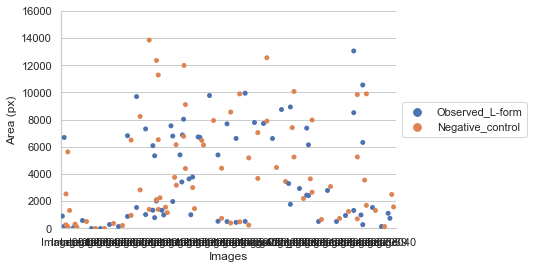

In [52]:
%matplotlib inline
sns.set(style="whitegrid")

g = sns.swarmplot(x="serie", y="roi_px_area", hue="type_image", data=df_results[df_results['channel']=='GFP'], dodge=True)

g.set(xlabel="Images", ylabel = "Area (px)")
g.set(ylim=(0,16000))
g.legend(loc='center left', bbox_to_anchor=(1.0, 0.5), ncol=1)
g = sns.despine(top=True, right=True, left=False, bottom=False, offset=0, trim=False)

plt.show()

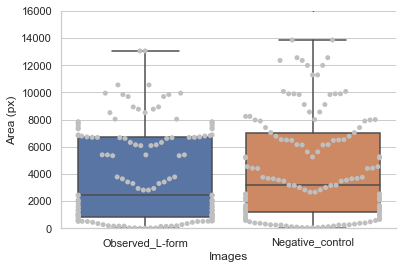

In [53]:
%matplotlib inline
sns.set(style="whitegrid")

g2 = sns.boxplot(x="type_image", y="roi_px_area", data=df_results)
g2 = sns.swarmplot(x="type_image", y="roi_px_area", data=df_results, color=".75")

g2.set(xlabel="Images", ylabel = "Area (px)")
g2.set(ylim=(0,16000))
g2 = sns.despine(top=True, right=True, left=False, bottom=False, offset=0, trim=False)

plt.show()

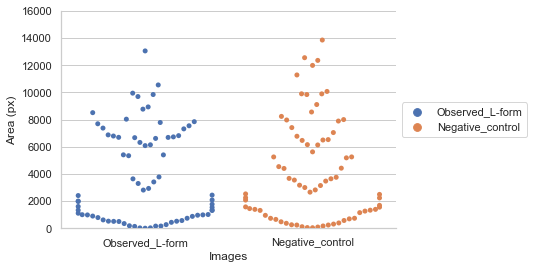

In [54]:
%matplotlib inline
sns.set(style="whitegrid")

g3 = sns.swarmplot(x="type_image", y="roi_px_area", hue="type_image", data=df_results[df_results['channel']=='GFP'], dodge=False)

g3.set(xlabel="Images", ylabel = "Area (px)")
g3.set(ylim=(0,16000))
g3.legend(loc='center left', bbox_to_anchor=(1.0, 0.5), ncol=1)
g3 = sns.despine(top=True, right=True, left=False, bottom=False, offset=0, trim=False)

plt.show()

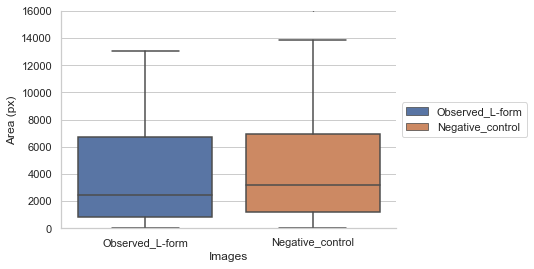

In [55]:
%matplotlib inline
sns.set(style="whitegrid")

g4 = sns.boxplot(x="type_image", y="roi_px_area", hue="type_image", data=df_results[df_results['channel']=='GFP'], dodge=False)

g4.set(xlabel="Images", ylabel = "Area (px)")
g4.set(ylim=(0,16000))
g4.legend(loc='center left', bbox_to_anchor=(1.0, 0.5), ncol=1)
g4 = sns.despine(top=True, right=True, left=False, bottom=False, offset=0, trim=False)

plt.show()

##### Average pixel intensity

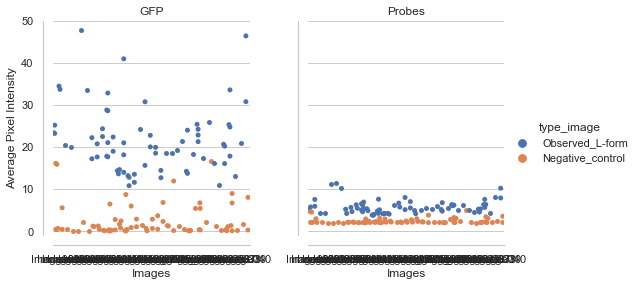

In [56]:
%matplotlib inline
sns.set(style="whitegrid")

h = sns.catplot(x="serie", y="average_px_intensity", hue="type_image", col='channel', data=df_results, kind='swarm', dodge=True, height=4, aspect=.9, sharey=True)

(h.set_axis_labels("Images", "Average Pixel Intensity")
    #.set_xticklabels()
    .set_titles("{col_name}")
    .set(ylim=(-1,50))
    .despine(top=True, right=True, left=False, bottom=False, offset=10, trim=False))  

plt.show()

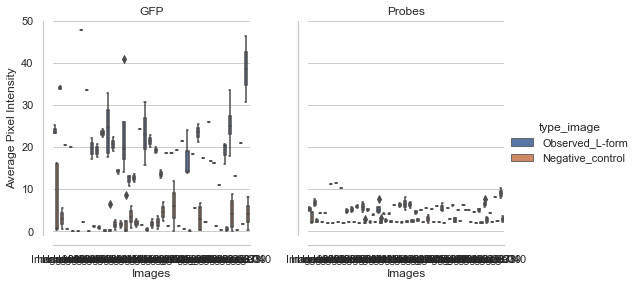

In [57]:
%matplotlib inline
sns.set(style="whitegrid")

h2 = sns.catplot(x="serie", y="average_px_intensity", hue="type_image", col='channel', data=df_results, kind='box', dodge=True, height=4, aspect=.9, sharey=True)
#h2 = sns.catplot(x="serie", y="average_px_intensity", hue="type_image", col='channel', data=df_results, kind='swarm', dodge=True, height=4, aspect=.9, sharey=True, color=".25")

(h2.set_axis_labels("Images", "Average Pixel Intensity")
    #.set_xticklabels()
    .set_titles("{col_name}")
    .set(ylim=(-1,50))
    .despine(top=True, right=True, left=False, bottom=False, offset=10, trim=False)) 

plt.show()

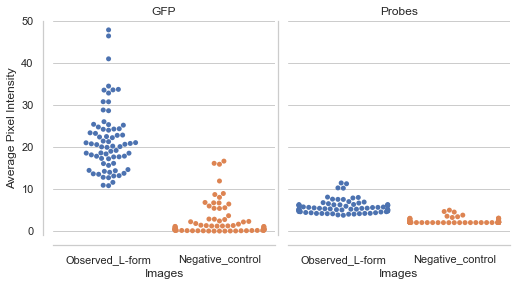

In [58]:
%matplotlib inline
sns.set(style="whitegrid")

h3 = sns.catplot(x="type_image", y="average_px_intensity", hue="type_image", col='channel', data=df_results, kind='swarm', dodge=False, height=4, aspect=.9, sharey=True)

(h3.set_axis_labels("Images", "Average Pixel Intensity")
    #.set_xticklabels()
    .set_titles("{col_name}")
    .set(ylim=(-1,50))
    .despine(top=True, right=True, left=False, bottom=False, offset=10, trim=False))  

plt.show()

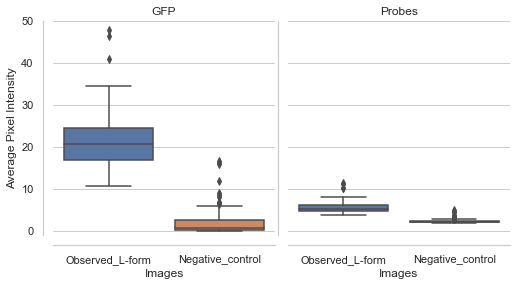

In [59]:
%matplotlib inline
sns.set(style="whitegrid")

h4 = sns.catplot(x="type_image", y="average_px_intensity", hue="type_image", col='channel', data=df_results, kind='box', dodge=False, height=4, aspect=.9, sharey=True)

(h4.set_axis_labels("Images", "Average Pixel Intensity")
    #.set_xticklabels()
    .set_titles("{col_name}")
    .set(ylim=(-1,50))
    .despine(top=True, right=True, left=False, bottom=False, offset=10, trim=False))  

plt.show()

##### Minimal px intensity

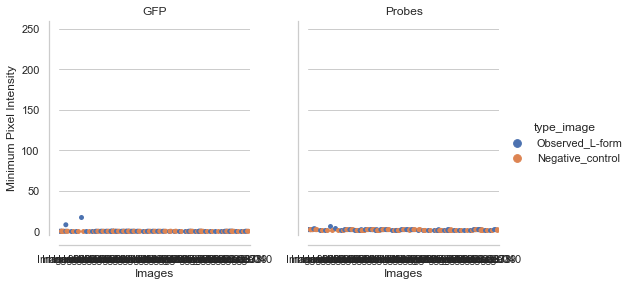

In [60]:
%matplotlib inline
sns.set(style="whitegrid")

j = sns.catplot(x="serie", y="min_px_intensity", hue="type_image", col='channel', data=df_results, kind='swarm', dodge=True, height=4, aspect=.9, sharey=True)

(j.set_axis_labels("Images", "Minimum Pixel Intensity")
    #.set_xticklabels()
    .set_titles("{col_name}")
    .set(ylim=(-5,260))
    .despine(top=True, right=True, left=False, bottom=False, offset=10, trim=False))  

plt.show()

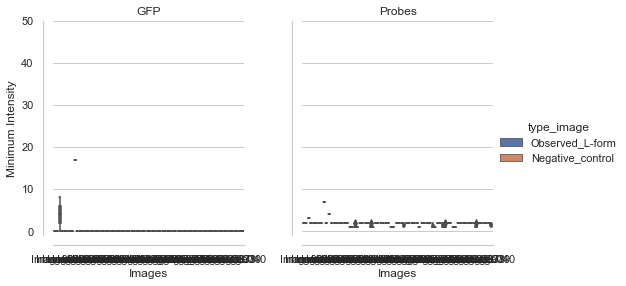

In [61]:
%matplotlib inline
sns.set(style="whitegrid")

j2 = sns.catplot(x="serie", y="min_px_intensity", hue="type_image", col='channel', data=df_results, kind='box', dodge=True, height=4, aspect=.9, sharey=True)
#h2 = sns.catplot(x="serie", y="average_px_intensity", hue="type_image", col='channel', data=df_results, kind='swarm', dodge=True, height=4, aspect=.9, sharey=True, color=".25")

(j2.set_axis_labels("Images", "Minimum Intensity")
    #.set_xticklabels()
    .set_titles("{col_name}")
    .set(ylim=(-1,50))
    .despine(top=True, right=True, left=False, bottom=False, offset=10, trim=False)) 

plt.show()

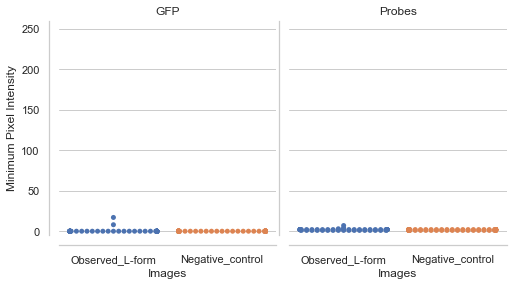

In [62]:
%matplotlib inline
sns.set(style="whitegrid")

j3 = sns.catplot(x="type_image", y="min_px_intensity", hue="type_image", col='channel', data=df_results, kind='swarm', dodge=False, height=4, aspect=.9, sharey=True)

(j3.set_axis_labels("Images", "Minimum Pixel Intensity")
    #.set_xticklabels()
    .set_titles("{col_name}")
    .set(ylim=(-5,260))
    .despine(top=True, right=True, left=False, bottom=False, offset=10, trim=False))  

plt.show()

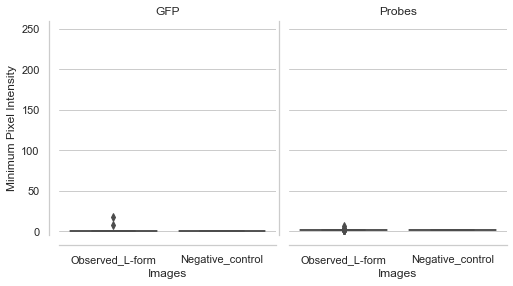

In [63]:
%matplotlib inline
sns.set(style="whitegrid")

j4 = sns.catplot(x="type_image", y="min_px_intensity", hue="type_image", col='channel', data=df_results, kind='box', dodge=False, height=4, aspect=.9, sharey=True)

(j4.set_axis_labels("Images", "Minimum Pixel Intensity")
    #.set_xticklabels()
    .set_titles("{col_name}")
    .set(ylim=(-5,260))
    .despine(top=True, right=True, left=False, bottom=False, offset=10, trim=False))  

plt.show()

##### Maximal px intensity

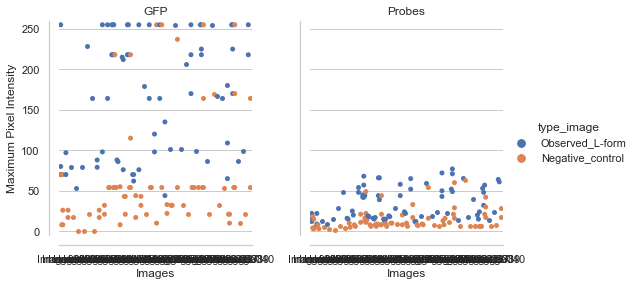

In [64]:
%matplotlib inline
sns.set(style="whitegrid")

k = sns.catplot(x="serie", y="max_px_intensity", hue="type_image", col='channel', data=df_results, kind='swarm', dodge=True, height=4, aspect=.9, sharey=True)

(k.set_axis_labels("Images", "Maximum Pixel Intensity")
    #.setx_xticklabels()
    .set_titles("{col_name}")
    .set(ylim=(-5,260))
    .despine(top=True, right=True, left=False, bottom=False, offset=10, trim=False))  

plt.show()

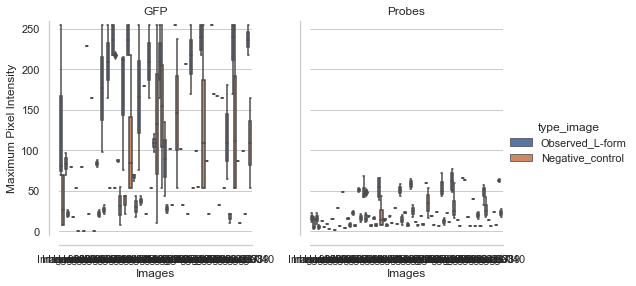

In [65]:
%matplotlib inline
sns.set(style="whitegrid")

k2 = sns.catplot(x="serie", y="max_px_intensity", hue="type_image", col='channel', data=df_results, kind='box', dodge=True, height=4, aspect=.9, sharey=True)

(k2.set_axis_labels("Images", "Maximum Pixel Intensity")
    #.set_xticklabels()
    .set_titles("{col_name}")
    .set(ylim=(-5,260))
    .despine(top=True, right=True, left=False, bottom=False, offset=10, trim=False))  

plt.show()

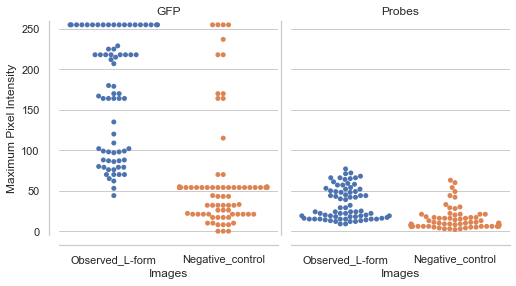

In [66]:
%matplotlib inline
sns.set(style="whitegrid")

k3 = sns.catplot(x="type_image", y="max_px_intensity", hue="type_image", col='channel', data=df_results, kind='swarm', dodge=False, height=4, aspect=.9, sharey=True)

(k3.set_axis_labels("Images", "Maximum Pixel Intensity")
    #.set_xticklabels()
    .set_titles("{col_name}")
    .set(ylim=(-5,260))
    .despine(top=True, right=True, left=False, bottom=False, offset=10, trim=False))  

plt.show()

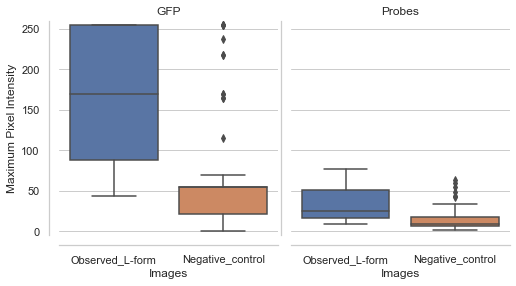

In [67]:
%matplotlib inline
sns.set(style="whitegrid")

k4 = sns.catplot(x="type_image", y="max_px_intensity", hue="type_image", col='channel', data=df_results, kind='box', dodge=False, height=4, aspect=.9, sharey=True)

(k4.set_axis_labels("Images", "Maximum Pixel Intensity")
    #.set_xticklabels()
    .set_titles("{col_name}")
    .set(ylim=(-5,260))
    .despine(top=True, right=True, left=False, bottom=False, offset=10, trim=False))  

plt.show()

### Apply the resulting thresholding for enhancing the images brightness

In [33]:
df_results = pd.read_parquet('parquets/df_results_200316_Sample_12.lif_2020-08-28_15:32:57.816767.parquet')

#### Enhanced image with a global threshold

In [136]:
def enhanced_img(image_list, threshold_low, threshold_high, brightness_factor):
    '''Return the list of enhanced images'''
    
    enhanced_image_list = []
    
    for img in image_list:
        new_img = np.where(img < threshold_low, 0, img)
        enhanced_image_list.append(np.where(new_img > threshold_high, brightness_factor*new_img, new_img))
        #enhanced_image_list.append(np.where(img < threshold_low, 0, brightness_factor*img))
        
    return enhanced_image_list

In [139]:
brightness_factor_gfp_channel = 250
brightness_factor_probe_channel = 270

#threshold_low_gfp_channel = 54 #df_results.loc[(df_results['type_image'] == 'Negative_control') & (df_results['channel'] == 'GFP')][['max_px_intensity']].max().tolist()
threshold_low_gfp_channel = df_results.loc[(df_results['type_image'] == 'Negative_control') & (df_results['channel'] == 'GFP') & (df_results['max_px_intensity'] != 255)][['max_px_intensity']].mean().tolist()
#threshold_low_probe_channel = 26 #df_results.loc[(df_results['type_image'] == 'Negative_control') & (df_results['channel'] == 'Probes')][['max_px_intensity']].max().tolist()
threshold_low_probe_channel = df_results.loc[(df_results['type_image'] == 'Negative_control') & (df_results['channel'] == 'Probes')][['max_px_intensity']].mean().tolist()

threshold_high_gfp_channel = df_results.loc[(df_results['type_image'] == 'Negative_control') & (df_results['channel'] == 'GFP')][['average_px_intensity']].max().tolist()
threshold_high_probe_channel = df_results.loc[(df_results['type_image'] == 'Negative_control') & (df_results['channel'] == 'Probes')][['average_px_intensity']].max().tolist()

enhanced_gfp_img = enhanced_img(gfp_img, threshold_low_gfp_channel, threshold_high_gfp_channel, brightness_factor_gfp_channel)
enhanced_probe_img = enhanced_img(probe_img, threshold_low_probe_channel, threshold_high_probe_channel, brightness_factor_probe_channel)

In [36]:
#nucleus_idx = [img1[0], img2[0], img3[0]]
#DIC_idx = [img1[2], img2[2], img3[2]]

nucleus_img = get_images_from_idx(nucleus_idx)
DIC_img = get_images_from_idx(DIC_idx)

In [37]:
enhanced_DIC_img = []

for img in DIC_img:
    enhanced_DIC_img.append(img*3)

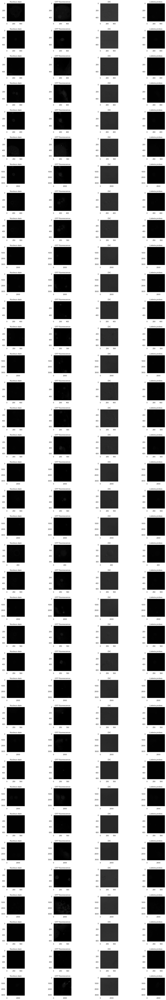

CPU times: user 43.3 s, sys: 1.55 s, total: 44.9 s
Wall time: 45 s


In [78]:
%%time
%matplotlib inline
sns.set_style("whitegrid", {'axes.grid' : False})

row = len(gfp_idx)
col = 4

a = col*5
b = row*3

k = 0

sequence = [nucleus_img, gfp_img, DIC_img, probe_img]
title = ['Nucleus stain', 'GFP fluorescence', 'DIC', 'Listeria probes']
color_maps = [plt.cm.gray, plt.cm.gray, plt.cm.gray, plt.cm.gray]
v_min = [0, 0, 0, 0]
v_max = [255, 255, 255, 255]

fig = plt.figure(figsize=(a, b))
fig.subplots_adjust(hspace=0.5, wspace=0.1)
for i in range(row):
    for j in range(len(sequence)):
        plt.subplot(row, col, k+1)
        plt.imshow(sequence[j][i], cmap = color_maps[j], vmin=v_min[j], vmax=v_max[j])
        plt.title(title[j])
        k=k+1
        
    
plt.show()

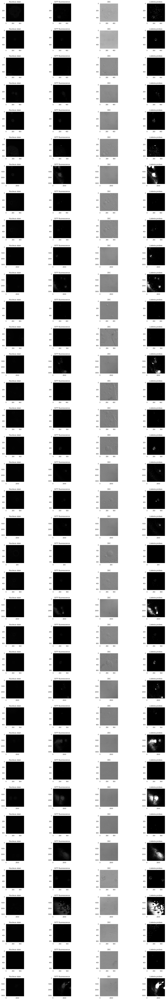

CPU times: user 48.8 s, sys: 1.36 s, total: 50.1 s
Wall time: 51 s


In [140]:
%%time
%matplotlib inline
sns.set_style("whitegrid", {'axes.grid' : False})

row = len(gfp_idx)
col = 4

a = col*5
b = row*3

k = 0

sequence = [nucleus_img, enhanced_gfp_img, enhanced_DIC_img, enhanced_probe_img]
title = ['Nucleus stain', 'GFP fluorescence', 'DIC', 'Listeria probes']
color_maps = [plt.cm.gray, plt.cm.gray, plt.cm.gray, plt.cm.gray]
v_min = [0, 0, 0, 0]
v_max = [255, 255, 255, 255]

fig = plt.figure(figsize=(a, b))
fig.subplots_adjust(hspace=0.5, wspace=0.1)
for i in range(row):
    for j in range(len(sequence)):
        plt.subplot(row, col, k+1)
        plt.imshow(sequence[j][i], cmap = color_maps[j], vmin=v_min[j], vmax=v_max[j])
        plt.title(title[j])
        k=k+1
        
    
plt.show()

##### Enhanced image with an individual threshold

In [59]:
def enhanced_img_ind_th(image_list, threshold_low, threshold_high, brightness_factor):
    '''Return the list of enhanced images'''
    
    enhanced_image_list = []
    
    for img, th_low, th_high in zip(image_list, threshold_low, threshold_high):
        new_img = np.where(img < th_low, 0, img)
        enhanced_image_list.append(np.where(new_img > th_high, brightness_factor*new_img, new_img))
        #enhanced_image_list.append(np.where(img < th_low, 0, brightness_factor*img))
        
    return enhanced_image_list

In [286]:
brightness_factor_gfp_channel = 240
brightness_factor_probe_channel = 240

threshold_low_gfp_channel = []
a = df_results.loc[(df_results['type_image'] == 'Negative_control') & (df_results['channel'] == 'GFP')][['max_px_intensity']].values.tolist()
for x in a:
    threshold_low_gfp_channel.extend(x)
threshold_low_probe_channel = []
b = df_results.loc[(df_results['type_image'] == 'Negative_control') & (df_results['channel'] == 'Probes')][['max_px_intensity']].values.tolist()
for y in b:
    threshold_low_probe_channel.extend(y)
    
threshold_high_gfp_channel = []
c = df_results.loc[(df_results['type_image'] == 'Negative_control') & (df_results['channel'] == 'GFP')][['average_px_intensity']].values.tolist()
for z in c:
    threshold_high_gfp_channel.extend(z)
threshold_high_probe_channel = []
d = df_results.loc[(df_results['type_image'] == 'Negative_control') & (df_results['channel'] == 'Probes')][['average_px_intensity']].values.tolist()
for m in d:
    threshold_high_probe_channel.extend(m)

enhanced_gfp_img_2 = enhanced_img_ind_th(gfp_img, threshold_low_gfp_channel, threshold_high_gfp_channel, brightness_factor_gfp_channel)
enhanced_probe_img_2 = enhanced_img_ind_th(probe_img, threshold_low_probe_channel, threshold_high_probe_channel, brightness_factor_probe_channel)

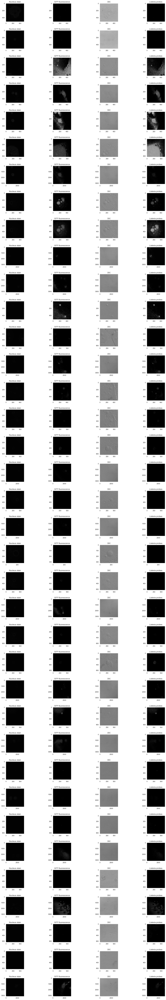

CPU times: user 45 s, sys: 1.56 s, total: 46.6 s
Wall time: 47.3 s


In [287]:
%%time
%matplotlib inline
sns.set_style("whitegrid", {'axes.grid' : False})

row = len(gfp_idx)
col = 4

a = col*5
b = row*3

k = 0

sequence = [nucleus_img, enhanced_gfp_img_2, enhanced_DIC_img, enhanced_probe_img_2]
title = ['Nucleus stain', 'GFP fluorescence', 'DIC', 'Listeria probes']
color_maps = [plt.cm.gray, plt.cm.gray, plt.cm.gray, plt.cm.gray]
#color_maps = [plt.cm.gray, plt.cm.gray, plt.cm.gray, plt.cm.gist_heat]
v_min = [0, 0, 0, 0]
v_max = [255, 255, 255, 255]

fig = plt.figure(figsize=(a, b))
fig.subplots_adjust(hspace=0.5, wspace=0.1)
for i in range(row):
    for j in range(len(sequence)):
        plt.subplot(row, col, k+1)
        plt.imshow(sequence[j][i], cmap = color_maps[j], vmin=v_min[j], vmax=v_max[j])
        plt.title(title[j])
        k=k+1
        
    
plt.show()

### Save images in tiff format

In [143]:
# Original images

for idx, img in zip(gfp_idx, gfp_img):
    imageio.imwrite(f'extracted_images/original_img_{idx}.tiff', img)
    
for idx, img in zip(DIC_idx, DIC_img):
    imageio.imwrite(f'extracted_images/original_img_{idx}.tiff', img)
    
for idx, img in zip(probe_idx, probe_img):
    imageio.imwrite(f'extracted_images/original_img_{idx}.tiff', img)

In [144]:
# Enhanced images with global thresholding

for idx, img in zip(gfp_idx, enhanced_gfp_img):
    imageio.imwrite(f'extracted_images/enh_img_{idx}.tiff', img)
    
for idx, img in zip(DIC_idx, enhanced_DIC_img):
    imageio.imwrite(f'extracted_images/enh_img_{idx}.tiff', img)
    
for idx, img in zip(probe_idx, enhanced_probe_img):
    imageio.imwrite(f'extracted_images/enh_img_{idx}.tiff', img)

In [158]:
# Save enhanced images with individual thresholding

for idx, img in zip(gfp_idx, enhanced_gfp_img_2):
    imageio.imwrite(f'extracted_images/enh_img_ind_th_{idx}.tiff', img)
    
for idx, img in zip(probe_idx, enhanced_probe_img_2):
    imageio.imwrite(f'extracted_images/enh_img_ind_th_{idx}.tiff', img)

In [279]:
enhanced_DIC_img[0]

array([[168, 168, 177, ..., 171, 162, 168],
       [180, 174, 174, ..., 162, 174, 165],
       [162, 180, 177, ..., 186, 156, 156],
       ...,
       [174, 186, 168, ..., 171, 171, 180],
       [171, 183, 171, ..., 165, 165, 168],
       [174, 186, 174, ..., 168, 171, 183]], dtype=uint8)

### Save images in color

#### Create a scale bar

In [268]:
import matplotlib.offsetbox
from matplotlib.lines import Line2D

class AnchoredHScaleBar(matplotlib.offsetbox.AnchoredOffsetbox):
    """ size: length of bar in data units
        extent : height of bar ends in axes units """
    def __init__(self, size=1, extent = 0.01, label="", loc=2, ax=None,
                 pad=0.4, borderpad=0.5, ppad = 0, sep=2, prop=None, 
                 frameon=True, linekw={}, **kwargs):
        if not ax:
            ax = plt.gca()
        trans = ax.get_xaxis_transform()
        size_bar = matplotlib.offsetbox.AuxTransformBox(trans)
        line = Line2D([0,size],[0,0], **linekw)
        vline1 = Line2D([0,0],[-extent/2.,extent/2.], **linekw)
        vline2 = Line2D([size,size],[-extent/2.,extent/2.], **linekw)
        size_bar.add_artist(line)
        size_bar.add_artist(vline1)
        size_bar.add_artist(vline2)
        txt = matplotlib.offsetbox.TextArea(label, minimumdescent=False)
        self.vpac = matplotlib.offsetbox.VPacker(children=[size_bar,txt],  
                                 align="center", pad=ppad, sep=sep) 
        matplotlib.offsetbox.AnchoredOffsetbox.__init__(self, loc, pad=pad, 
                 borderpad=borderpad, child=self.vpac, prop=prop, frameon=frameon,
                 **kwargs)

#### Build Channel Manually

##### Green Channel

In [294]:
for idx_g, img_g in zip(gfp_idx, enhanced_gfp_img_2):
    
    a = img_g # Green
    
    A = np.zeros((a.shape[0], a.shape[1], 3), dtype=np.int)
    A[:,:,1] = a # 1 Green
    
    imageio.imwrite(f'extracted_images/enh_img_ind_th_{idx_g}_green.tiff', A)

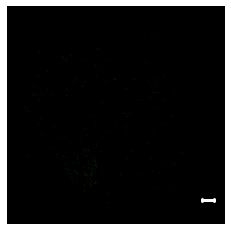

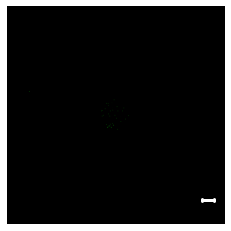

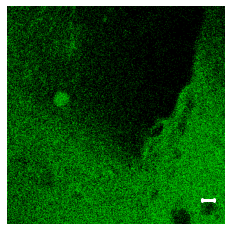

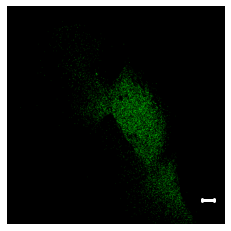

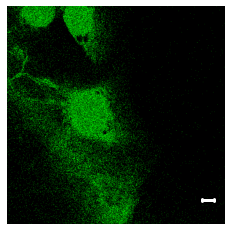

...

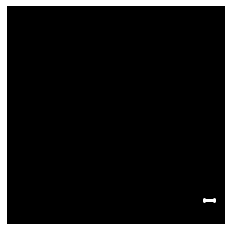

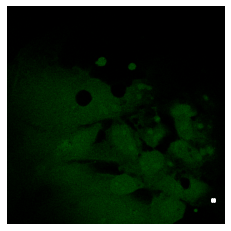

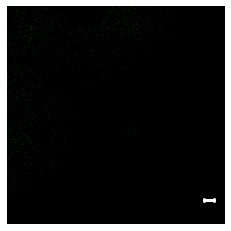

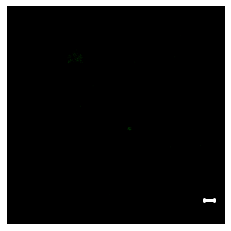

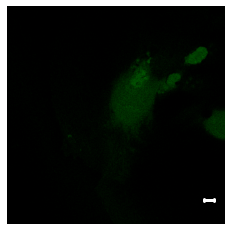

In [288]:
scale_bar = df_eukaryote['scale_bar_10um'].tolist()

for idx_g, img_g, bar in zip(gfp_idx, enhanced_gfp_img_2, scale_bar):
    
    a = img_g # Green
    
    A = np.zeros((a.shape[0], a.shape[1], 3), dtype=np.int)
    A[:,:,1] = a # 1 Green
    
    fig, ax = plt.subplots()
    plt.imshow(A)

    ob = AnchoredHScaleBar(size=bar, label="", loc=4, frameon=False,
                           pad=0.6, sep=3, linekw=dict(color="white", linewidth=3)) 
    ax.add_artist(ob)
    plt.axis('off')
    
    plt.savefig(f'trial/enh_img_ind_th_{idx_g}_color.tiff')
    
    plt.show();

##### Red Channel

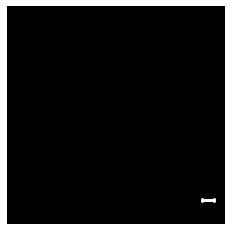

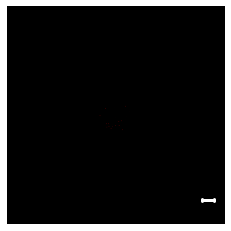

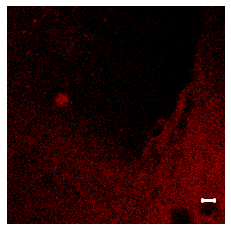

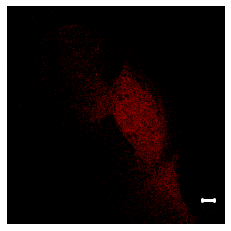

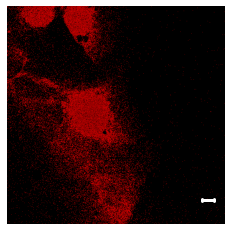

...

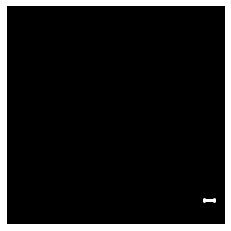

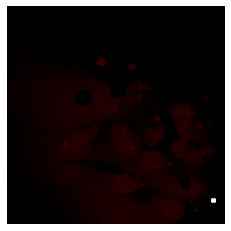

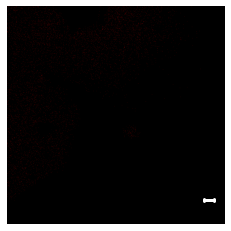

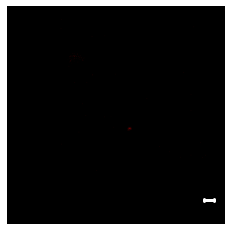

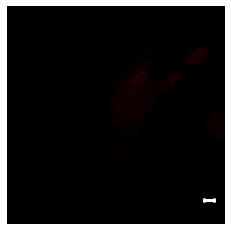

In [289]:
scale_bar = df_eukaryote['scale_bar_10um'].tolist()

for idx_r, img_r, bar in zip(probe_idx, enhanced_probe_img_2, scale_bar):
    
    b = img_r # Red
    
    B = np.zeros((b.shape[0], b.shape[1], 3), dtype=np.int)
    B[:,:,0] = b # 0 Red
    
    fig, ax = plt.subplots()
    plt.imshow(B)

    ob = AnchoredHScaleBar(size=bar, label="", loc=4, frameon=False,
                           pad=0.6, sep=3, linekw=dict(color="white", linewidth=3)) 
    ax.add_artist(ob)
    plt.axis('off')
    
    plt.savefig(f'trial/enh_img_ind_th_{idx_r}_color.tiff')
    
    plt.show();

##### Merged Green and Red Channels

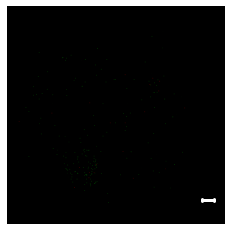

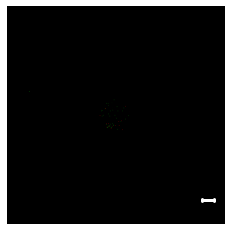

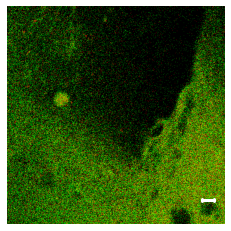

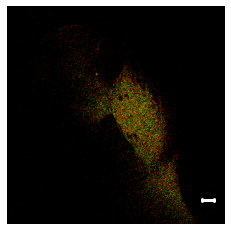

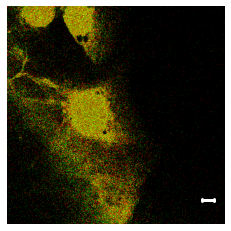

...

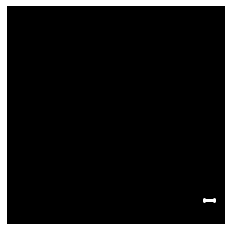

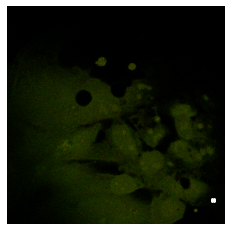

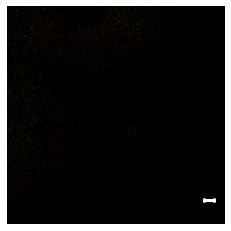

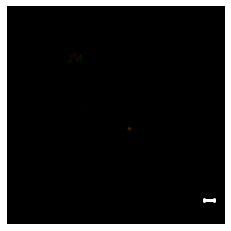

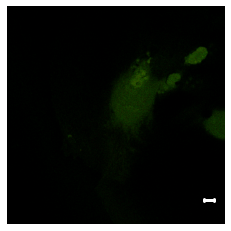

In [292]:
scale_bar = df_eukaryote['scale_bar_10um'].tolist()

for idx_g, idx_r, img_g, img_r, bar in zip(gfp_idx, probe_idx, enhanced_gfp_img_2, enhanced_probe_img_2, scale_bar):
    
    a = img_g # Green
    b = img_r # Red
    
    assert a.shape == b.shape
    
    C = np.zeros((a.shape[0], a.shape[1], 3), dtype=np.int)
    C[:,:,0] = b # 0 Red
    C[:,:,1] = a # 1 Green
    
    fig, ax = plt.subplots()
    plt.imshow(C)

    ob = AnchoredHScaleBar(size=bar, label="", loc=4, frameon=False,
                           pad=0.6, sep=3, linekw=dict(color="white", linewidth=3)) 
    ax.add_artist(ob)
    plt.axis('off')
    
    plt.savefig(f'trial/enh_img_ind_th_{idx_g}_{idx_r}_color.svg')
    
    plt.show();

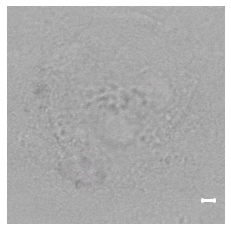

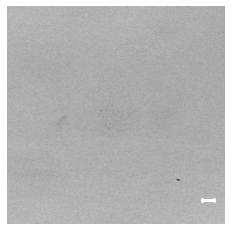

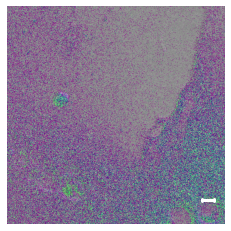

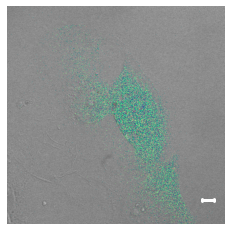

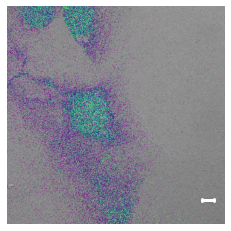

...

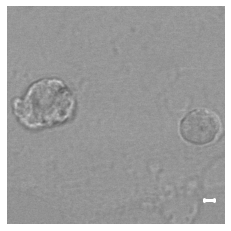

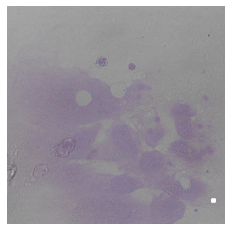

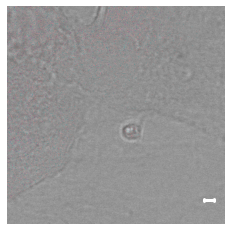

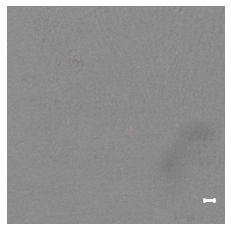

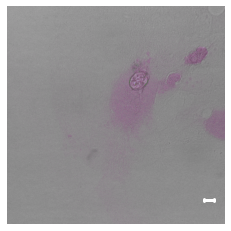

In [291]:
scale_bar = df_eukaryote['scale_bar_10um'].tolist()

for idx_g, idx_r, img_g, img_r, idx_d, img_d, bar in zip(gfp_idx, probe_idx, enhanced_gfp_img_2, enhanced_probe_img_2, DIC_idx, enhanced_DIC_img, scale_bar):
    
    a = img_g # Green
    b = img_r # Red
    d1 = img_d # Green
    d2 = img_d # Red
    d3 = img_d # Blue
    
    D = np.zeros((d1.shape[0], d1.shape[1], 3), dtype=np.int)
    D[:,:,0] = d2+b # 0 Red
    D[:,:,1] = d1+a # 1 Green
    D[:,:,2] = d3 # 1 Green
    
    fig, ax = plt.subplots()
    plt.imshow(D)

    ob = AnchoredHScaleBar(size=bar, label="", loc=4, frameon=False,
                           pad=0.6, sep=3, linekw=dict(color="white", linewidth=3)) 
    ax.add_artist(ob)
    plt.axis('off')
    
    plt.savefig(f'trial/enh_img_ind_th_{idx_d}_color.tiff')
    
    plt.show();